# Capstone Project Level - 1 
## Employee Data extraction, processing and analysis 
### Analytix Labs
#### Jadeja Jesalba M

In [1]:
from pyspark.sql import SparkSession #this is the module that connects to apache spark
from pyspark.sql import SQLContext

In [2]:
spark = (SparkSession.builder.appName("csp1_jes").config("hive.metastore.uris", "thrift://ip-10-1-2-24.ap-south-1.compute.internal:9083").enableHiveSupport().getOrCreate())
#this creates a Spark session that allows us to connect to spark and configure the program

In [3]:
spark

#### Employee Data
    - the database and table structure

In [4]:
#The database for my porject is named 'csp1_jes'
spark.sql("use csp1_jes")

DataFrame[]

In [5]:
#List of all tables in my database
spark.sql("show tables").show()

+--------+----------------+-----------+
|database|       tableName|isTemporary|
+--------+----------------+-----------+
|csp1_jes| departments_jes|      false|
|csp1_jes|    dept_emp_jes|      false|
|csp1_jes|dept_manager_jes|      false|
|csp1_jes|   employees_jes|      false|
|csp1_jes|    salaries_jes|      false|
|csp1_jes|      titles_jes|      false|
+--------+----------------+-----------+



In [6]:
#The desc shows the description of the schema of the table
#Titles - Job titles of employees
spark.sql("desc titles_jes").show()

+--------+---------+-------+
|col_name|data_type|comment|
+--------+---------+-------+
|title_id|   string|       |
|   title|   string|       |
+--------+---------+-------+



In [7]:
spark.sql("Select * from titles_jes").show()

+--------+------------------+
|title_id|             title|
+--------+------------------+
|   s0001|             Staff|
|   s0002|      Senior Staff|
|   e0001|Assistant Engineer|
|   e0002|          Engineer|
|   e0003|   Senior Engineer|
|   e0004|  Technique Leader|
|   m0001|           Manager|
+--------+------------------+



In [8]:
#Departments - The departments in the organisation
spark.sql("desc departments_jes").show()

+---------+---------+-------+
| col_name|data_type|comment|
+---------+---------+-------+
|  dept_no|   string|       |
|dept_name|   string|       |
+---------+---------+-------+



In [9]:
spark.sql("Select * from departments_jes").show()

+-------+--------------------+
|dept_no|           dept_name|
+-------+--------------------+
|   d001|         "Marketing"|
|   d002|           "Finance"|
|   d003|   "Human Resources"|
|   d004|        "Production"|
|   d005|       "development"|
|   d006|"Quality Management"|
|   d007|             "Sales"|
|   d008|          "Research"|
|   d009|  "Customer Service"|
+-------+--------------------+



In [10]:
#Department Employees - which department each employee belongs to
spark.sql("desc dept_emp_jes").show()

+--------+---------+-------+
|col_name|data_type|comment|
+--------+---------+-------+
|  emp_no|      int|       |
| dept_no|   string|       |
+--------+---------+-------+



In [11]:
spark.sql("Select * from dept_emp_jes limit 20").show()

+------+-------+
|emp_no|dept_no|
+------+-------+
| 10001|   d005|
| 10002|   d007|
| 10003|   d004|
| 10004|   d004|
| 10005|   d003|
| 10006|   d005|
| 10007|   d008|
| 10008|   d005|
| 10009|   d006|
| 10010|   d004|
| 10010|   d006|
| 10011|   d009|
| 10012|   d005|
| 10013|   d003|
| 10014|   d005|
| 10015|   d008|
| 10016|   d007|
| 10017|   d001|
| 10018|   d004|
| 10018|   d005|
+------+-------+



In [12]:
#Department Managers - Managers of each department in the organisation
spark.sql("desc dept_manager_jes").show()

+--------+---------+-------+
|col_name|data_type|comment|
+--------+---------+-------+
| dept_no|   string|       |
|  emp_no|      int|       |
+--------+---------+-------+



In [13]:
spark.sql("select * from dept_manager_jes limit 20").show()

+-------+------+
|dept_no|emp_no|
+-------+------+
|   d001|110022|
|   d001|110039|
|   d002|110085|
|   d002|110114|
|   d003|110183|
|   d003|110228|
|   d004|110303|
|   d004|110344|
|   d004|110386|
|   d004|110420|
|   d005|110511|
|   d005|110567|
|   d006|110725|
|   d006|110765|
|   d006|110800|
|   d006|110854|
|   d007|111035|
|   d007|111133|
|   d008|111400|
|   d008|111534|
+-------+------+



In [14]:
#Employees - Personal employee information
spark.sql("desc employees_jes").show()

+--------------------+---------+-------+
|            col_name|data_type|comment|
+--------------------+---------+-------+
|              emp_no|      int|       |
|        emp_title_id|   string|       |
|          birth_date|   string|       |
|          first_name|   string|       |
|           last_name|   string|       |
|                 sex|   string|       |
|           hire_date|   string|       |
|      no_of_projects|      int|       |
|last_performance_...|   string|       |
|            left_org|      int|       |
|           last_date|   string|       |
+--------------------+---------+-------+



In [15]:
spark.sql("select * from employees_jes limit 20").show()

+------+------------+----------+----------+----------+---+----------+--------------+-----------------------+--------+----------+
|emp_no|emp_title_id|birth_date|first_name| last_name|sex| hire_date|no_of_projects|last_performance_rating|left_org| last_date|
+------+------------+----------+----------+----------+---+----------+--------------+-----------------------+--------+----------+
|
|
|
|
|
|
|
|
|
|
|
|
|
|
|
|
|
|
|
|
+------+------------+----------+----------+----------+---+----------+--------------+-----------------------+--------+----------+



In [16]:
#Salaries - salaries of each employee
spark.sql("desc salaries_jes").show()

+--------+---------+-------+
|col_name|data_type|comment|
+--------+---------+-------+
|  emp_no|      int|       |
|  salary|      int|       |
+--------+---------+-------+



In [17]:
spark.sql("select * from salaries_jes limit 20").show()

+------+------+
|emp_no|salary|
+------+------+
| 10001| 60117|
| 10002| 65828|
| 10003| 40006|
| 10004| 40054|
| 10005| 78228|
| 10006| 40000|
| 10007| 56724|
| 10008| 46671|
| 10009| 60929|
| 10010| 72488|
| 10011| 42365|
| 10012| 40000|
| 10013| 40000|
| 10014| 46168|
| 10015| 40000|
| 10016| 70889|
| 10017| 71380|
| 10018| 55881|
| 10019| 44276|
| 10020| 40000|
+------+------+



#### 1) A list showing employee number, last name, first name, sex, and salary for each employee1. 

In [18]:
spark.sql("select e.emp_no, e.last_name, e.first_name, e.sex, s.salary from employees_jes e JOIN salaries_jes s on e.emp_no = s.emp_no").show()

+------+----------+----------+---+------+
|emp_no| last_name|first_name|sex|salary|
+------+----------+----------+---+------+
|473302|  Zallocco|  Hideyuki|  M| 40000|
|475053| Delgrande|     Byong|  F| 53422|
| 57444|      Babb|     Berry|  F| 48973|
|421786|  Verhoeff|     Xiong|  M| 40000|
|282238|   Baumann|Abdelkader|  F| 40000|
|263976|  Cusworth|      Eran|  M| 40000|
|273487|   Parfitt| Christoph|  M| 56087|
|461591|  Samarati|    Xudong|  M| 40000|
|477657| Magliocco|    Lihong|  M| 54816|
|219881|     Speek| Kwangyoen|  F| 40000|
| 29920|     Tyugu|   Shuichi|  F| 40000|
|208153|      Lunn|   Abdulah|  M| 50183|
| 13616|     Lorho|     Perry|  F| 40000|
|246449|Bultermann|     Subbu|  F| 87084|
| 21529|  Zallocco|     Bojan|  M| 40000|
| 17934|  Wuwongse|  Bilhanan|  M| 48795|
| 48085|      Gilg|Venkatesan|  M| 63016|
|239838|     Dulli|   Naftali|  M| 57715|
|240129|    Karnin|     Roddy|  M| 43548|
|205246|    Demizu|     Nevio|  F| 80252|
+------+----------+----------+---+

#### 2) A list showing first name, last name, and hire date for employees who were hired in 1986.

In [19]:
spark.sql("select first_name, last_name, hire_date from employees_jes where hire_date between '1/1/1986' and '12/31/1986' order by hire_date").show()

+----------+---------------+---------+
|first_name|      last_name|hire_date|
+----------+---------------+---------+
|   Yongmao|      Fritzsche| 1/1/1986|
|   Jianhao|          Serot| 1/1/1986|
|       Uri|         Asmuth| 1/1/1986|
|    Shawna|       Reinhart| 1/1/1986|
|     Mario|       Orlowska| 1/1/1986|
|    Sumant|        Stemann| 1/1/1986|
| Manibrata|         Stiles| 1/1/1986|
|     Bedir|Vanwelkenhuysen| 1/1/1986|
|    Sanjay|      Servieres| 1/1/1986|
|     Vidya|       Dymetman| 1/1/1986|
|      Zita|      Shobatake| 1/1/1986|
|   Arlette|       Boguraev| 1/1/1986|
|    Saniya|       Lanphier| 1/1/1986|
|     Ziyad|  Bhattacharjee| 1/1/1986|
|    Filipe|        Bottner| 1/1/1986|
|      Moto|        Kenevan| 1/1/1986|
|   Zhanqiu|       Buescher| 1/1/1986|
|    Sachar|           Undy| 1/1/1986|
| Alejandra|           Luce| 1/1/1986|
|    Tamiya|         Simkin| 1/1/1986|
+----------+---------------+---------+
only showing top 20 rows



#### 3) A list showing the manager of each department with the following information: department number, department name, the manager's employee number, last name, first name.

In [20]:
spark.sql("select d.dept_no, d.dept_name, dm.emp_no, e.last_name, e.first_name from departments_jes d join dept_manager_jes dm on d.dept_no = dm.dept_no join employees_jes e on dm.emp_no = e.emp_no").show()

+-------+--------------------+------+------------+-----------+
|dept_no|           dept_name|emp_no|   last_name| first_name|
+-------+--------------------+------+------------+-----------+
|   d009|  "Customer Service"|111877|    Spinelli|    Xiaobin|
|   d008|          "Research"|111534|      Kambil|     Hilary|
|   d006|"Quality Management"|110765|     Hofmeyr|     Rutger|
|   d004|        "Production"|110420|    Ghazalie|      Oscar|
|   d006|"Quality Management"|110725|     Onuegbe|  Peternela|
|   d001|         "Marketing"|110022|  Markovitch|  Margareta|
|   d007|             "Sales"|111035|   Kaelbling|Przemyslawa|
|   d005|       "development"|110511|    Hagimont|   DeForest|
|   d005|       "development"|110567|    DasSarma|       Leon|
|   d003|   "Human Resources"|110183|Ossenbruggen|    Shirish|
|   d009|  "Customer Service"|111939|     Weedman|    Yuchang|
|   d002|           "Finance"|110114|  Legleitner|      Isamu|
|   d006|"Quality Management"|110854|       Pesch|     

#### 4) A list showing the department of each employee with the following information: employee number, last name, first name, and department name.

In [21]:
spark.sql("select de.emp_no, e.last_name, e.first_name, d.dept_name from dept_emp_jes de join employees_jes e on de.emp_no = e.emp_no join departments_jes d on de.dept_no = d.dept_no").show()

+------+----------+----------+--------------------+
|emp_no| last_name|first_name|           dept_name|
+------+----------+----------+--------------------+
|473302|  Zallocco|  Hideyuki|           "Finance"|
|475053| Delgrande|     Byong|        "Production"|
| 57444|      Babb|     Berry|        "Production"|
|421786|  Verhoeff|     Xiong|   "Human Resources"|
|282238|   Baumann|Abdelkader|"Quality Management"|
|263976|  Cusworth|      Eran|"Quality Management"|
|273487|   Parfitt| Christoph|   "Human Resources"|
|461591|  Samarati|    Xudong|           "Finance"|
|477657| Magliocco|    Lihong|"Quality Management"|
|219881|     Speek| Kwangyoen|  "Customer Service"|
| 29920|     Tyugu|   Shuichi|        "Production"|
|208153|      Lunn|   Abdulah|       "development"|
| 13616|     Lorho|     Perry|          "Research"|
| 13616|     Lorho|     Perry|       "development"|
|246449|Bultermann|     Subbu|             "Sales"|
| 21529|  Zallocco|     Bojan|       "development"|
| 17934|  Wu

#### 5) A list showing first name, last name, and sex for employees whose first name is "Hercules" and last names begin with "B".

In [22]:
spark.sql("select first_name, last_name, sex from employees_jes where first_name = 'Hercules' and last_name Like 'B%'").show()

+----------+-------------+---+
|first_name|    last_name|sex|
+----------+-------------+---+
|  Hercules|         Baer|  M|
|  Hercules|        Biron|  F|
|  Hercules|        Birge|  F|
|  Hercules|      Berstel|  F|
|  Hercules|    Bernatsky|  M|
|  Hercules|         Bail|  F|
|  Hercules|       Bodoff|  M|
|  Hercules|     Benantar|  F|
|  Hercules|      Basagni|  M|
|  Hercules|Bernardinello|  F|
|  Hercules|   Baranowski|  M|
|  Hercules|      Bisiani|  F|
|  Hercules|   Benzmuller|  M|
|  Hercules|         Bahr|  M|
|  Hercules|        Biran|  F|
|  Hercules|         Bain|  F|
|  Hercules|      Brendel|  F|
|  Hercules|      Buchter|  M|
|  Hercules|     Barreiro|  M|
|  Hercules|         Baak|  M|
+----------+-------------+---+



#### 6) A list showing all employees in the Sales department, including their employee number, last name, first name, and department name.

In [23]:
spark.sql("select e.emp_no, e.last_name, e.first_name, d.dept_name from employees_jes e join dept_emp_jes de \
on de.emp_no = e.emp_no join departments_jes d on de.dept_no = d.dept_no where d.dept_no like '%d007%'").show()

+------+-------------+----------+---------+
|emp_no|    last_name|first_name|dept_name|
+------+-------------+----------+---------+
|246449|   Bultermann|     Subbu|  "Sales"|
|205246|       Demizu|     Nevio|  "Sales"|
|476443|       Asmuth|      Ziya|  "Sales"|
|424270|    Yoshizawa|    Kellyn|  "Sales"|
|280408|         Perl|   Elliott|  "Sales"|
|289261|     Nollmann|       Gad|  "Sales"|
|444985|     Verspoor|      Giap|  "Sales"|
|477628|Beutelspacher|      Duro|  "Sales"|
| 42625|        Swick|  Harngdar|  "Sales"|
| 85093|       Covnot| Nectarios|  "Sales"|
|205366|    Shimshoni|  Kazuhira|  "Sales"|
| 37601|    Naumovich|   Gilbert|  "Sales"|
|437985|        Munke|    Reuven|  "Sales"|
| 28823|     Skafidas|     Tonny|  "Sales"|
|107258|       Zaumen|    Parviz|  "Sales"|
| 11980|         Pews| Yechezkel|  "Sales"|
|457800|      Domenig| Stabislas|  "Sales"|
|414537|     Businaro|   Chikara|  "Sales"|
|414885|       Vecchi|   Candido|  "Sales"|
|217945|        Georg|    Shmuel

#### 7) A list showing all employees in the Sales and Development departments, including their employee number, last name, first name, and department name.

In [24]:
spark.sql("select e.emp_no, e.last_name, e.first_name, d.dept_name from employees_jes e join dept_emp_jes de \
on de.emp_no = e.emp_no join departments_jes d on de.dept_no = d.dept_no where d.dept_no like '%d007%' or d.dept_no like '%d005%'").show()

+------+----------+----------+-------------+
|emp_no| last_name|first_name|    dept_name|
+------+----------+----------+-------------+
|208153|      Lunn|   Abdulah|"development"|
| 13616|     Lorho|     Perry|"development"|
|246449|Bultermann|     Subbu|      "Sales"|
| 21529|  Zallocco|     Bojan|"development"|
| 17934|  Wuwongse|  Bilhanan|"development"|
|205246|    Demizu|     Nevio|      "Sales"|
|476443|    Asmuth|      Ziya|      "Sales"|
|424270| Yoshizawa|    Kellyn|      "Sales"|
| 71530|  McAlpine|Venkatesan|"development"|
|280408|      Perl|   Elliott|      "Sales"|
|104639|   Escriba|    Theron|"development"|
|214555|     Copas|   Nechama|"development"|
| 35916|    Talmon|    Wonhee|"development"|
| 61583|    Vecchi|      Ziva|"development"|
|422587|     Speek|     Mohit|"development"|
| 48885| Antonisse|     Phuoc|"development"|
|244492|    Pettit|   Shaunak|"development"|
|289261|  Nollmann|       Gad|      "Sales"|
| 26941|  Masamoto|    Shigeu|"development"|
|444985|  

#### 8) A list showing the frequency count of employee last names, in descending order. (i.e., how many employees share the same last name)

In [25]:
spark.sql("select last_name, COUNT(last_name) as lm_frequency from employees_jes group by last_name order by lm_frequency DESC").show()

+-----------+------------+
|  last_name|lm_frequency|
+-----------+------------+
|       Baba|         226|
|      Coorg|         223|
|     Gelosh|         223|
|     Farris|         222|
|    Sudbeck|         222|
|     Adachi|         221|
|     Osgood|         220|
|    Mandell|         218|
|     Masada|         218|
|     Neiman|         218|
|    Wendorf|         217|
|Boudaillier|         217|
|     Mahnke|         216|
|     Pettis|         216|
|    Solares|         216|
|   Cummings|         216|
|     Emmart|         215|
|   Collette|         215|
|   Birjandi|         215|
|    Kulisch|         215|
+-----------+------------+
only showing top 20 rows



#### 9) Histogram to show the salary distribution among the employees

In [26]:
import numpy as np #Basically a fast linear algebra library
import seaborn as sns #Data visualisation based on matplotlib
import matplotlib.pyplot as plt #Data visualisation
import pandas as pd #To convert hive data into a pandas dataframe for data visualization

In [27]:
#Creating a pandas dataframe with salary column
emp_salaries = spark.sql("select * from salaries_jes")

In [28]:
emp_salaries = emp_salaries.toPandas()

In [29]:
emp_salaries.head(20)

,emp_no,salary
0,10001,60117
1,10002,65828
2,10003,40006
3,10004,40054
4,10005,78228
5,10006,40000
6,10007,56724
7,10008,46671
8,10009,60929
9,10010,72488


In [30]:
#Statistical overview of the salaries
emp_salaries['salary'].describe()

count    300024.000000
mean      52970.732451
std       14301.478491
min       40000.000000
25%       40000.000000
50%       48681.000000
75%       61758.000000
max      129492.000000
Name: salary, dtype: float64

In [30]:
#pip install -U seaborn

Text(0, 0.5, 'Employee count')

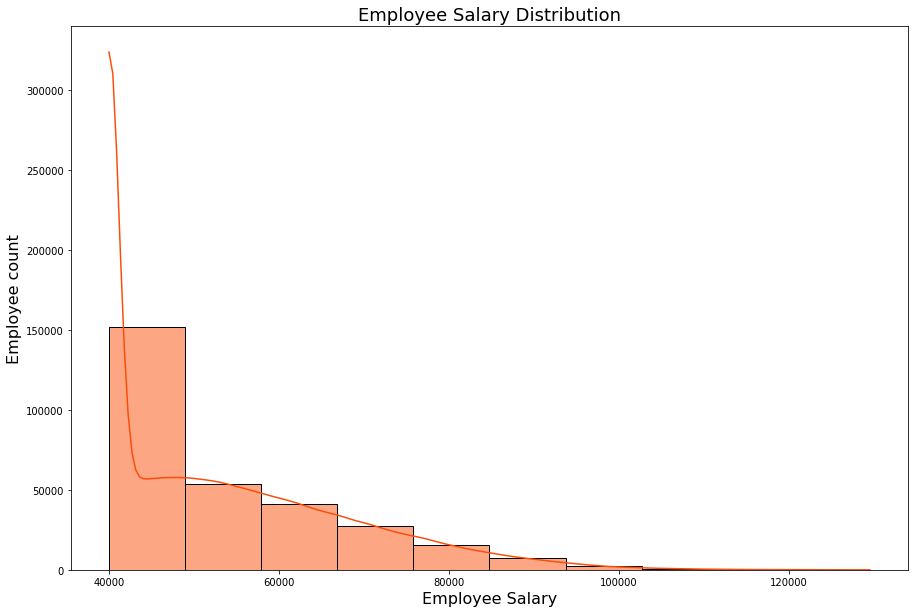

In [31]:
plt.figure(figsize = (15, 10))
sns.histplot(data = emp_salaries, x = 'salary', bins = 10, kde = True, color = '#FB4E0B')
plt.title('Employee Salary Distribution', fontsize = 18)
plt.xlabel('Employee Salary', fontsize = 16)
plt.ylabel('Employee count', fontsize = 16)

#### 10) Bar graph to show the Average salary per title (designation)

In [32]:
#Creating pandas dataframe for titles
emp_titles = spark.sql("select * from titles_jes")

In [33]:
emp_titles = emp_titles.toPandas()

In [34]:
emp_titles.head()

,title_id,title
0,s0001,Staff
1,s0002,Senior Staff
2,e0001,Assistant Engineer
3,e0002,Engineer
4,e0003,Senior Engineer


In [35]:
#Creating pandas dataframe for employees 
emp = spark.sql("select * from employees_jes")

In [36]:
emp = emp.toPandas()

In [37]:
emp.head()

,emp_no,emp_title_id,birth_date,first_name,last_name,sex,hire_date,no_of_projects,last_performance_rating,left_org,last_date
0,473302,s0001,7/25/1953,Hideyuki,Zallocco,M,4/28/1990,2,A,0,\r
1,475053,e0002,11/18/1954,Byong,Delgrande,F,9/7/1991,1,C,0,\r
2,57444,e0002,1/30/1958,Berry,Babb,F,3/21/1992,9,A,0,\r
3,421786,s0001,9/28/1957,Xiong,Verhoeff,M,11/26/1987,2,C,0,\r
4,282238,e0003,10/28/1952,Abdelkader,Baumann,F,1/18/1991,6,B,0,\r


In [38]:
dept_emp = spark.sql("select * from dept_emp_jes")

In [39]:
dept_emp = dept_emp.toPandas()

In [40]:
dept_emp.head()

,emp_no,dept_no
0,10001,d005
1,10002,d007
2,10003,d004
3,10004,d004
4,10005,d003


In [41]:
#Rename columns to merge tables
emp_new = emp_titles.rename(columns={'title_id': 'emp_title_id'})

In [42]:
emp_new.head()

,emp_title_id,title
0,s0001,Staff
1,s0002,Senior Staff
2,e0001,Assistant Engineer
3,e0002,Engineer
4,e0003,Senior Engineer


In [43]:
#Merge salaries and employees tables
emp_comb = pd.merge(emp_salaries, emp, on="emp_no", how="inner")

In [44]:
emp_comb.head()

,emp_no,salary,emp_title_id,birth_date,first_name,last_name,sex,hire_date,no_of_projects,last_performance_rating,left_org,last_date
0,10001,60117,e0003,9/2/1953,Georgi,Facello,M,6/26/1986,9,C,1,7/30/1994\r
1,10002,65828,s0001,6/2/1964,Bezalel,Simmel,F,11/21/1985,8,B,0,\r
2,10003,40006,e0003,12/3/1959,Parto,Bamford,M,8/28/1986,1,C,0,\r
3,10004,40054,e0003,5/1/1954,Chirstian,Koblick,M,12/1/1986,5,A,0,\r
4,10005,78228,s0001,1/21/1955,Kyoichi,Maliniak,M,9/12/1989,6,A,0,\r


In [45]:
emp_comb2 = pd.merge(emp_comb, emp_new, on="emp_title_id", how="inner")

In [46]:
emp_comb2.head()

,emp_no,salary,emp_title_id,birth_date,first_name,last_name,sex,hire_date,no_of_projects,last_performance_rating,left_org,last_date,title
0,10001,60117,e0003,9/2/1953,Georgi,Facello,M,6/26/1986,9,C,1,7/30/1994\r,Senior Engineer
1,10003,40006,e0003,12/3/1959,Parto,Bamford,M,8/28/1986,1,C,0,\r,Senior Engineer
2,10004,40054,e0003,5/1/1954,Chirstian,Koblick,M,12/1/1986,5,A,0,\r,Senior Engineer
3,10006,40000,e0003,4/20/1953,Anneke,Preusig,F,6/2/1989,10,B,0,\r,Senior Engineer
4,10009,60929,e0003,4/19/1952,Sumant,Peac,F,2/18/1985,8,B,0,\r,Senior Engineer


In [47]:
emp_sal_grouped = emp_comb2.groupby("title").mean()

In [48]:
emp_sal_grouped

,emp_no,salary,no_of_projects,left_org
title,,,,
Assistant Engineer,252992.595373,48564.434447,5.483805,0.095973
Engineer,253654.345919,48535.336511,5.502886,0.099507
Manager,110780.833333,51531.041667,4.750000,0.083333
Senior Engineer,253038.749885,48506.799871,5.497171,0.100197
Senior Staff,254481.798969,58550.172704,5.525674,0.096979
Staff,253408.503604,58465.382850,5.509936,0.099577
Technique Leader,251811.432730,48582.896092,5.496765,0.101201


In [49]:
#In emp_sal_grouped the index is the title therefor it needs to be changed to use for plotting later on
emp_sal_grouped2 = emp_sal_grouped.reset_index()

In [50]:
emp_sal_grouped2

,title,emp_no,salary,no_of_projects,left_org
0,Assistant Engineer,252992.595373,48564.434447,5.483805,0.095973
1,Engineer,253654.345919,48535.336511,5.502886,0.099507
2,Manager,110780.833333,51531.041667,4.750000,0.083333
3,Senior Engineer,253038.749885,48506.799871,5.497171,0.100197
4,Senior Staff,254481.798969,58550.172704,5.525674,0.096979
5,Staff,253408.503604,58465.382850,5.509936,0.099577
6,Technique Leader,251811.432730,48582.896092,5.496765,0.101201


In [51]:
emp_sal_grouped2 = emp_sal_grouped2.sort_values('salary')

Text(0, 0.5, 'Employee Job Title')

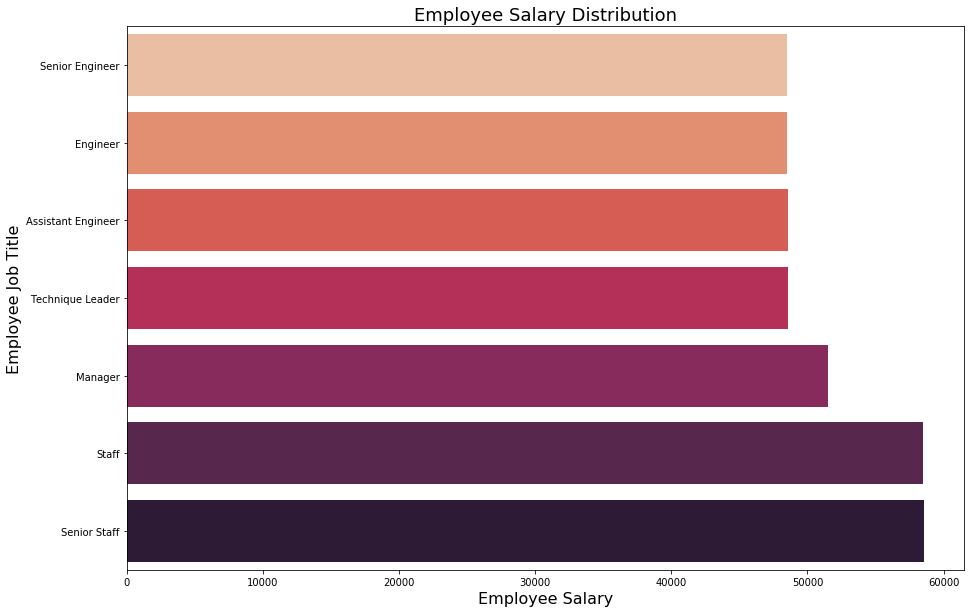

In [52]:
plt.figure(figsize = (15, 10))
sns.barplot(x = 'salary', y = 'title', data = emp_sal_grouped2, palette = 'rocket_r')
plt.title('Employee Salary Distribution', fontsize = 18)
plt.xlabel('Employee Salary', fontsize = 16)
plt.ylabel('Employee Job Title', fontsize = 16)

##### Insights
    - It is apparent that senior staff earns the highest salary followed by Managers and lastly other staff

In [53]:
#Making one dataframe from all separate data files 
emp_full = pd.merge(dept_emp, emp_comb2, on="emp_no", how="inner")

In [54]:
emp_full.head()

,emp_no,dept_no,salary,emp_title_id,birth_date,first_name,last_name,sex,hire_date,no_of_projects,last_performance_rating,left_org,last_date,title
0,10001,d005,60117,e0003,9/2/1953,Georgi,Facello,M,6/26/1986,9,C,1,7/30/1994\r,Senior Engineer
1,10002,d007,65828,s0001,6/2/1964,Bezalel,Simmel,F,11/21/1985,8,B,0,\r,Staff
2,10003,d004,40006,e0003,12/3/1959,Parto,Bamford,M,8/28/1986,1,C,0,\r,Senior Engineer
3,10004,d004,40054,e0003,5/1/1954,Chirstian,Koblick,M,12/1/1986,5,A,0,\r,Senior Engineer
4,10005,d003,78228,s0001,1/21/1955,Kyoichi,Maliniak,M,9/12/1989,6,A,0,\r,Staff


#### 11) Salary distribution by sex

In [55]:
import plotly.express as px

In [56]:
plt.figure(figsize = (15, 10))
plot1 = px.histogram(emp_full, x = 'salary', color= "sex", nbins = 10, title='Salary distribution by sex', 
                    labels={'salary':'Employee Salary'})
plot1.show()

<Figure size 1080x720 with 0 Axes>

#### 12)  No of employees per designation segregated by salary

In [57]:
plt.figure(figsize = (15, 10))
plot2 = px.bar(emp_sal_grouped2, x = 'title', y = 'emp_no', color = 'salary')
plot2.show()

<Figure size 1080x720 with 0 Axes>

### Machine Learning 

In [58]:
#Making a copy so that I can use it if there are any errors in future code
emp_full2 = emp_full.copy()

In [59]:
#Dataframe information
emp_full2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 331603 entries, 0 to 331602
Data columns (total 14 columns):
 #   Column                   Non-Null Count   Dtype 
---  ------                   --------------   ----- 
 0   emp_no                   331603 non-null  int32 
 1   dept_no                  331603 non-null  object
 2   salary                   331603 non-null  int32 
 3   emp_title_id             331603 non-null  object
 4   birth_date               331603 non-null  object
 5   first_name               331603 non-null  object
 6   last_name                331603 non-null  object
 7   sex                      331603 non-null  object
 8   hire_date                331603 non-null  object
 9   no_of_projects           331603 non-null  int32 
 10  last_performance_rating  331603 non-null  object
 11  left_org                 331603 non-null  int32 
 12  last_date                331603 non-null  object
 13  title                    331603 non-null  object
dtypes: int32(4), object(

In [60]:
#Change the column types accordingly for further use
emp_full2['hire_date'] = pd.to_datetime(emp_full2['hire_date'])

In [61]:
emp_full2['birth_date'] = pd.to_datetime(emp_full2['birth_date'])

In [62]:
#The left_org column is the column that gives information about when an employee left the job post. 
#It has not been stored in a proper format hence I need to transform it.
emp_full2['last_date']

0         7/30/1994\r
1                  \r
2                  \r
3                  \r
4                  \r
             ...     
331598             \r
331599     12/15/1995
331600             \r
331601             \r
331602             \r
Name: last_date, Length: 331603, dtype: object

In [63]:
emp_full2['last_date'] = emp_full2['last_date'].replace(to_replace = '\r', value = '', regex = True)

In [64]:
emp_full2['last_date']

0          7/30/1994
1                   
2                   
3                   
4                   
             ...    
331598              
331599    12/15/1995
331600              
331601              
331602              
Name: last_date, Length: 331603, dtype: object

In [65]:
emp_full2['last_date'] = pd.to_datetime(emp_full2['last_date'])

In [66]:
emp_full2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 331603 entries, 0 to 331602
Data columns (total 14 columns):
 #   Column                   Non-Null Count   Dtype         
---  ------                   --------------   -----         
 0   emp_no                   331603 non-null  int32         
 1   dept_no                  331603 non-null  object        
 2   salary                   331603 non-null  int32         
 3   emp_title_id             331603 non-null  object        
 4   birth_date               331603 non-null  datetime64[ns]
 5   first_name               331603 non-null  object        
 6   last_name                331603 non-null  object        
 7   sex                      331603 non-null  object        
 8   hire_date                331603 non-null  datetime64[ns]
 9   no_of_projects           331603 non-null  int32         
 10  last_performance_rating  331603 non-null  object        
 11  left_org                 331603 non-null  int32         
 12  last_date       

There are total of 7 categorical variables. 
    - dept_no
    - emp_title_id
    - first_name
    - last_name
    - sex 
    - last_performance_rating
    - title
But not all are important for ML model, hence I will only transform those that are important which are emp_title_no/title, dept_no, sex, last_performace_rating. Here the dimension of columns is less and easily manageable hence I will encode thhe columns manually instead of using encoding functions and increasing the dimensions

In [67]:
emp_full2['sex'] = np.where(emp_full2['sex'] == 'F', 0, 1)

In [68]:
emp_full2['last_performance_rating'].value_counts()

B      118390
A      105982
C       78932
PIP     16661
S       11638
Name: last_performance_rating, dtype: int64

The last performance rating is a ordinal variable where the ratings are in the order of the highest rating being S, A, B, C and the least rating being PIP. While encoding ordinal variable the usual convention is to give highest value to the highest ordinal value. Hence I will give the ratings are follows:
    - S -> 4
    - A -> 3
    - B -> 2
    - C -> 1
    - PIP -> 0

In [69]:
emp_full2['last_performance_rating'] = emp_full2['last_performance_rating'].replace(to_replace = 'S', value = 4)

In [70]:
emp_full2['last_performance_rating'] = emp_full2['last_performance_rating'].replace(to_replace = 'A', value = 3)

In [71]:
emp_full2['last_performance_rating'] = emp_full2['last_performance_rating'].replace(to_replace = 'B', value = 2)

In [72]:
emp_full2['last_performance_rating'] = emp_full2['last_performance_rating'].replace(to_replace = 'C', value = 1)

In [73]:
emp_full2['last_performance_rating'] = emp_full2['last_performance_rating'].replace(to_replace = 'PIP', value = 0)

In [74]:
emp_full2['last_performance_rating'].value_counts()

2    118390
3    105982
1     78932
0     16661
4     11638
Name: last_performance_rating, dtype: int64

In [75]:
emp_full2['emp_title_id'].value_counts()

s0001    118815
e0003    107989
e0002     52268
s0002     29350
e0004     16726
e0001      6431
m0001        24
Name: emp_title_id, dtype: int64

Employee title id doesnt have any order hence, it doesn't matter what numbers are used to encode.

In [76]:
emp_full2['emp_title_id'] = emp_full2['emp_title_id'].replace(to_replace = 's0001', value = 0)

In [77]:
emp_full2['emp_title_id'] = emp_full2['emp_title_id'].replace(to_replace = 's0002', value = 1)

In [78]:
emp_full2['emp_title_id'] = emp_full2['emp_title_id'].replace(to_replace = 'e0001', value = 2)

In [79]:
emp_full2['emp_title_id'] = emp_full2['emp_title_id'].replace(to_replace = 'e0002', value = 3)

In [80]:
emp_full2['emp_title_id'] = emp_full2['emp_title_id'].replace(to_replace = 'e0003', value = 4)

In [81]:
emp_full2['emp_title_id'] = emp_full2['emp_title_id'].replace(to_replace = 'e0004', value = 5)

In [82]:
emp_full2['emp_title_id'] = emp_full2['emp_title_id'].replace(to_replace = 'm0001', value = 6)

In [83]:
emp_full2['emp_title_id'].value_counts()

0    118815
4    107989
3     52268
1     29350
5     16726
2      6431
6        24
Name: emp_title_id, dtype: int64

In [84]:
emp_full2['dept_no'].value_counts()

d005    85707
d004    73485
d007    52245
d009    23580
d008    21126
d001    20211
d006    20117
d003    17786
d002    17346
Name: dept_no, dtype: int64

There are a total of nine departments and they are not ordinal. Hence it does not matter what the numbers are used to encode.

In [85]:
emp_full2['dept_no'] = emp_full2['dept_no'].replace(to_replace = 'd001', value = 0)

In [86]:
emp_full2['dept_no'] = emp_full2['dept_no'].replace(to_replace = 'd002', value = 1)

In [87]:
emp_full2['dept_no'] = emp_full2['dept_no'].replace(to_replace = 'd003', value = 2)

In [88]:
emp_full2['dept_no'] = emp_full2['dept_no'].replace(to_replace = 'd004', value = 3)

In [89]:
emp_full2['dept_no'] = emp_full2['dept_no'].replace(to_replace = 'd005', value = 4)

In [90]:
emp_full2['dept_no'] = emp_full2['dept_no'].replace(to_replace = 'd006', value = 5)

In [91]:
emp_full2['dept_no'] = emp_full2['dept_no'].replace(to_replace = 'd007', value = 6)

In [92]:
emp_full2['dept_no'] = emp_full2['dept_no'].replace(to_replace = 'd008', value = 7)

In [93]:
emp_full2['dept_no'] = emp_full2['dept_no'].replace(to_replace = 'd009', value = 8)

In [94]:
emp_full2['dept_no'].value_counts()

4    85707
3    73485
6    52245
8    23580
7    21126
0    20211
5    20117
2    17786
1    17346
Name: dept_no, dtype: int64

In [95]:
emp_full2.head()

,emp_no,dept_no,salary,emp_title_id,birth_date,first_name,last_name,sex,hire_date,no_of_projects,last_performance_rating,left_org,last_date,title
0,10001,4,60117,4,1953-09-02,Georgi,Facello,1,1986-06-26,9,1,1,1994-07-30,Senior Engineer
1,10002,6,65828,0,1964-06-02,Bezalel,Simmel,0,1985-11-21,8,2,0,NaT,Staff
2,10003,3,40006,4,1959-12-03,Parto,Bamford,1,1986-08-28,1,1,0,NaT,Senior Engineer
3,10004,3,40054,4,1954-05-01,Chirstian,Koblick,1,1986-12-01,5,3,0,NaT,Senior Engineer
4,10005,2,78228,0,1955-01-21,Kyoichi,Maliniak,1,1989-09-12,6,3,0,NaT,Staff


Text(114.0, 0.5, 'Count')

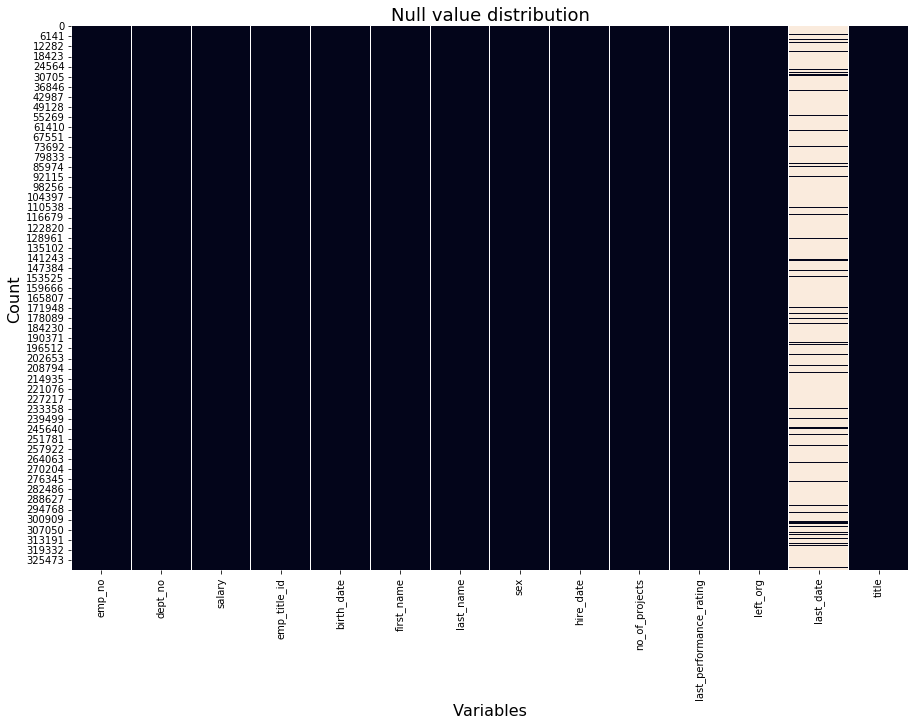

In [96]:
plt.figure(figsize = (15, 10))
null_plot = sns.heatmap(emp_full2.isnull(), cbar = False)
plt.title('Null value distribution', fontsize = 18)
plt.xlabel('Variables', fontsize = 16)
plt.ylabel('Count', fontsize = 16)

In [97]:
emp_full2.isna().sum()

emp_no                          0
dept_no                         0
salary                          0
emp_title_id                    0
birth_date                      0
first_name                      0
last_name                       0
sex                             0
hire_date                       0
no_of_projects                  0
last_performance_rating         0
left_org                        0
last_date                  298582
title                           0
dtype: int64

#### Insights
    - There are no null values in any variables except 'last_date' which means only a few employees have left the organisation

In [98]:
emp_full2.columns

Index(['emp_no', 'dept_no', 'salary', 'emp_title_id', 'birth_date',
       'first_name', 'last_name', 'sex', 'hire_date', 'no_of_projects',
       'last_performance_rating', 'left_org', 'last_date', 'title'],
      dtype='object')

In [99]:
#Correlation plot to find out between variables in the data
corr_features = ['dept_no', 'salary', 'emp_title_id', 'birth_date', 'sex', 'hire_date', 'no_of_projects', 
                 'last_performance_rating', 'left_org', 'last_date']

In [100]:
corr1 = emp_full2[corr_features]

In [101]:
corr1.head()

,dept_no,salary,emp_title_id,birth_date,sex,hire_date,no_of_projects,last_performance_rating,left_org,last_date
0,4,60117,4,1953-09-02,1,1986-06-26,9,1,1,1994-07-30
1,6,65828,0,1964-06-02,0,1985-11-21,8,2,0,NaT
2,3,40006,4,1959-12-03,1,1986-08-28,1,1,0,NaT
3,3,40054,4,1954-05-01,1,1986-12-01,5,3,0,NaT
4,2,78228,0,1955-01-21,1,1989-09-12,6,3,0,NaT


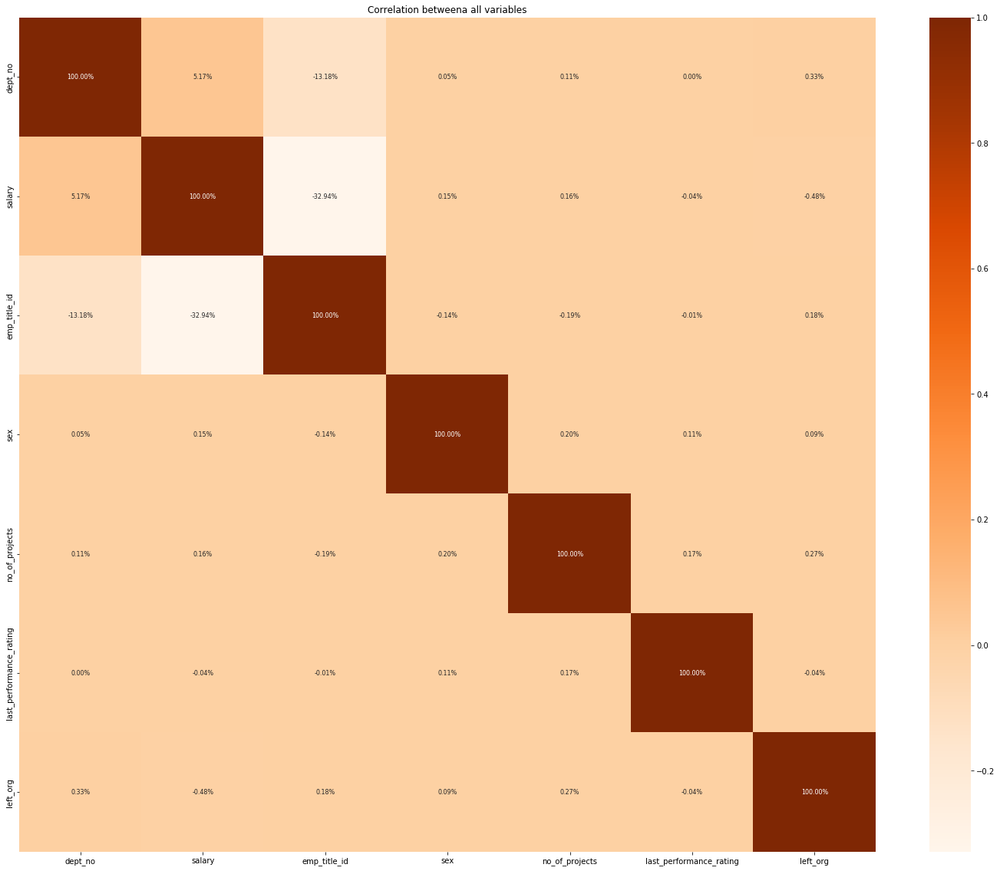

In [102]:
plt.figure(figsize = (25, 20))
corr_plot = sns.heatmap(corr1.corr(), annot = True, fmt = ".2%", cmap = 'Oranges', annot_kws = {'size': 8})
plt.title('Correlation betweena all variables')
plt.show()

#### Insights 
    - There doesn't seem to be much correlation between the variables therefore I will keep all of them for the model building

In [103]:
emp_spark = spark.createDataFrame(emp_full2) 

In [104]:
emp_spark.printSchema()

root
 |-- emp_no: long (nullable = true)
 |-- dept_no: long (nullable = true)
 |-- salary: long (nullable = true)
 |-- emp_title_id: long (nullable = true)
 |-- birth_date: timestamp (nullable = true)
 |-- first_name: string (nullable = true)
 |-- last_name: string (nullable = true)
 |-- sex: long (nullable = true)
 |-- hire_date: timestamp (nullable = true)
 |-- no_of_projects: long (nullable = true)
 |-- last_performance_rating: long (nullable = true)
 |-- left_org: long (nullable = true)
 |-- last_date: timestamp (nullable = true)
 |-- title: string (nullable = true)



In [105]:
emp_spark.show()

+------+-------+------+------------+-------------------+----------+-----------+---+-------------------+--------------+-----------------------+--------+-------------------+------------------+
|emp_no|dept_no|salary|emp_title_id|         birth_date|first_name|  last_name|sex|          hire_date|no_of_projects|last_performance_rating|left_org|          last_date|             title|
+------+-------+------+------------+-------------------+----------+-----------+---+-------------------+--------------+-----------------------+--------+-------------------+------------------+
| 10001|      4| 60117|           4|1953-09-02 00:00:00|    Georgi|    Facello|  1|1986-06-26 00:00:00|             9|                      1|       1|1994-07-30 00:00:00|   Senior Engineer|
| 10002|      6| 65828|           0|1964-06-02 00:00:00|   Bezalel|     Simmel|  0|1985-11-21 00:00:00|             8|                      2|       0|               null|             Staff|
| 10003|      3| 40006|           4|1959-12-0

In [106]:
#Creating a dataframe with the relevant variables 
emp_mfeatures = emp_spark.select('dept_no', 'salary', 'emp_title_id', 'birth_date', 'sex', 'hire_date', 'no_of_projects', 
                 'last_performance_rating', 'last_date', 'left_org')

In [107]:
emp_mfeatures.printSchema()

root
 |-- dept_no: long (nullable = true)
 |-- salary: long (nullable = true)
 |-- emp_title_id: long (nullable = true)
 |-- birth_date: timestamp (nullable = true)
 |-- sex: long (nullable = true)
 |-- hire_date: timestamp (nullable = true)
 |-- no_of_projects: long (nullable = true)
 |-- last_performance_rating: long (nullable = true)
 |-- last_date: timestamp (nullable = true)
 |-- left_org: long (nullable = true)



In [108]:
#converting the datatypes to spark datatypes
from pyspark.sql.types import StringType, DateType, IntegerType

In [109]:
emp_mfeatures = emp_mfeatures.withColumn("birth_date", 
                                  emp_mfeatures["birth_date"]
                                  .cast(IntegerType()))

In [110]:
emp_mfeatures = emp_mfeatures.withColumn("hire_date", 
                                  emp_mfeatures["hire_date"]
                                  .cast(IntegerType()))

In [111]:
emp_mfeatures = emp_mfeatures.withColumn("last_date", 
                                  emp_mfeatures["last_date"]
                                  .cast(IntegerType()))

In [112]:
emp_mfeatures = emp_mfeatures \
  .withColumn("dept_no" ,
              emp_mfeatures["dept_no"]
              .cast(IntegerType()))   \
  .withColumn("salary",
              emp_mfeatures["salary"]
              .cast(IntegerType()))    \
  .withColumn("emp_title_id"  ,
              emp_mfeatures["emp_title_id"]
              .cast(IntegerType())) \
  .withColumn("sex"  ,
              emp_mfeatures["sex"]
              .cast(IntegerType())) \
  .withColumn("no_of_projects",
              emp_mfeatures["no_of_projects"]
              .cast(IntegerType()))    \
  .withColumn("last_performance_rating",
              emp_mfeatures["last_performance_rating"]
              .cast(IntegerType()))    \
  .withColumn("left_org",
              emp_mfeatures["left_org"]
              .cast(IntegerType()))    \

In [113]:
emp_mfeatures.printSchema()

root
 |-- dept_no: integer (nullable = true)
 |-- salary: integer (nullable = true)
 |-- emp_title_id: integer (nullable = true)
 |-- birth_date: integer (nullable = true)
 |-- sex: integer (nullable = true)
 |-- hire_date: integer (nullable = true)
 |-- no_of_projects: integer (nullable = true)
 |-- last_performance_rating: integer (nullable = true)
 |-- last_date: integer (nullable = true)
 |-- left_org: integer (nullable = true)



In [114]:
features = emp_mfeatures.columns

In [115]:
emp_list = emp_mfeatures.columns[0:11]

In [116]:
#using the assembler to create a single vector column from a list of columns
from pyspark.ml.feature import VectorAssembler

In [117]:
assemblerInputs = emp_list
vecAssembler = VectorAssembler(inputCols = assemblerInputs, outputCol = "features")

In [118]:
#Definig the model
from pyspark.ml.classification import LogisticRegression

In [119]:
emp_lr = LogisticRegression(featuresCol = "features", labelCol = "left_org", regParam = 1.0)

In [120]:
#Building a pipeline to create the model
from pyspark.ml import Pipeline

In [121]:
#Defining the pipeline based on the stages created in previous steps
emp_pipeline = Pipeline(stages = [vecAssembler, emp_lr])